In [1]:
import os
import tempfile

import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import rcParams
from matplotlib import cm, colors
import scanpy as sc
import pandas as pd
import seaborn as sb
import scipy as sp
import numpy as np
import torch
from rich import print


# Define the path to the directory you want to change to
new_directory = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/Human_scVI_single'

# Use os.chdir() to change the working directory
os.chdir(new_directory)

In [2]:
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from matplotlib import rcParams
from matplotlib import cm, colors

# Define a nice color map for gene expression
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))  # Use PuRd color map for deep red/purple color
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))  # Greys for low values
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

In [4]:
plt.rcParams['figure.figsize']=(5,5) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=True, fontsize=12) #color_map=mymap2)
sc.settings.figdir = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/Human_scVI_single/figures_all/'
sc.logging.print_header()

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


## Figures for OL only human scVI

In [6]:
plt.rcParams['figure.figsize']=(5,5) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=True, fontsize=12) #color_map=mymap2)
sc.settings.figdir = '/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/Human_scVI_single/figures_OL/'
sc.logging.print_header()

scanpy==1.10.1 anndata==0.10.7 umap==0.5.6 numpy==1.26.4 scipy==1.11.4 pandas==2.2.2 scikit-learn==1.4.2 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.12


In [5]:
adata= sc.read_h5ad('/scratch365/eaboelno/BACKUP_h5ad_IMPORTANT/scVI_mdata_OL_NEW.h5ad')
adata

AnnData object with n_obs × n_vars = 200872 × 27766
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 's_score', 'g2m_score', 'phase', 'cell_cycle_diff', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'pct_counts_ribo', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'S_score', 'G2M_score', 'Cycling cells', 'Cycling_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DC

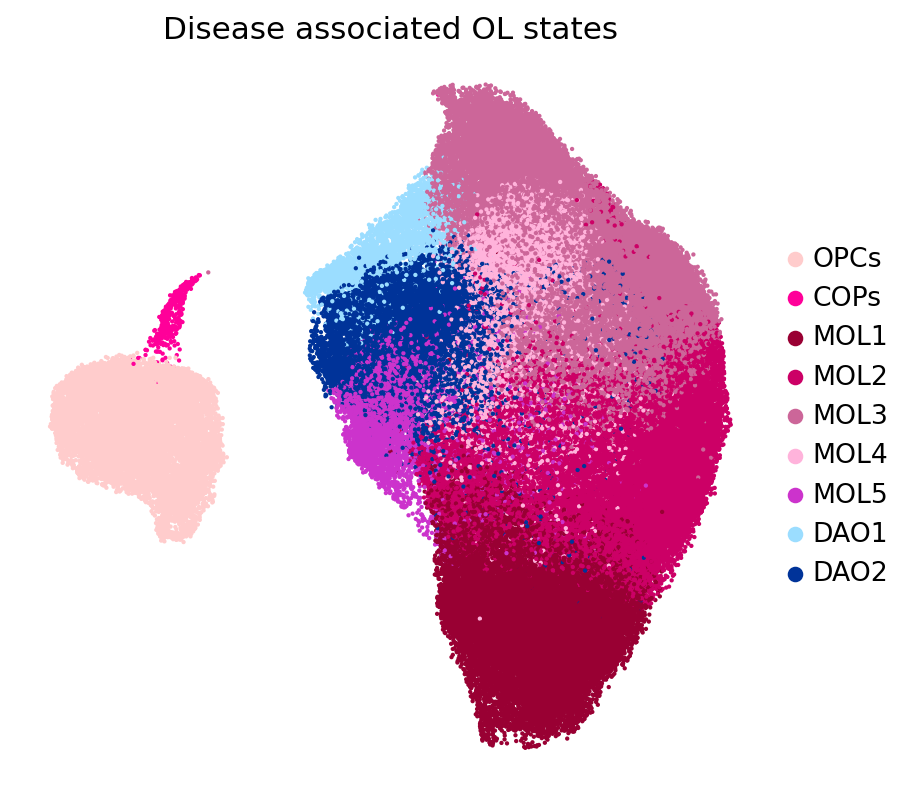

In [7]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

today='_July18'

cluster_color = {
    'MOL1': '#990033',
    'MOL2': '#cc0066',
    'MOL3': '#cc6699',
    'DAO1': '#9bddff',
    'DAO2': '#003399',
    'MOL4': '#ffb3db',
    'MOL5': '#cc33cc',
    'OPCs': '#ffcccc',
    'COPs': '#ff0099',
}

# Define the order of cell types
cell_type_order = ['OPCs', 'COPs', 'MOL1', 'MOL2', 'MOL3', 'MOL4', 'MOL5', 'DAO1', 'DAO2']

# Reorder the cell types
adata.obs['OL_fine_type'] = pd.Categorical(adata.obs['OL_fine_type'], 
                                                     categories=cell_type_order, ordered=True)

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['OL_fine_type'], legend_fontsize =float(12) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=15,
           legend_fontweight= 'bold', title='Disease associated OL states', frameon= False , 
           legend_fontoutline=1,)# save=today+'_human_scVI_integration_OL_cell_type.png')

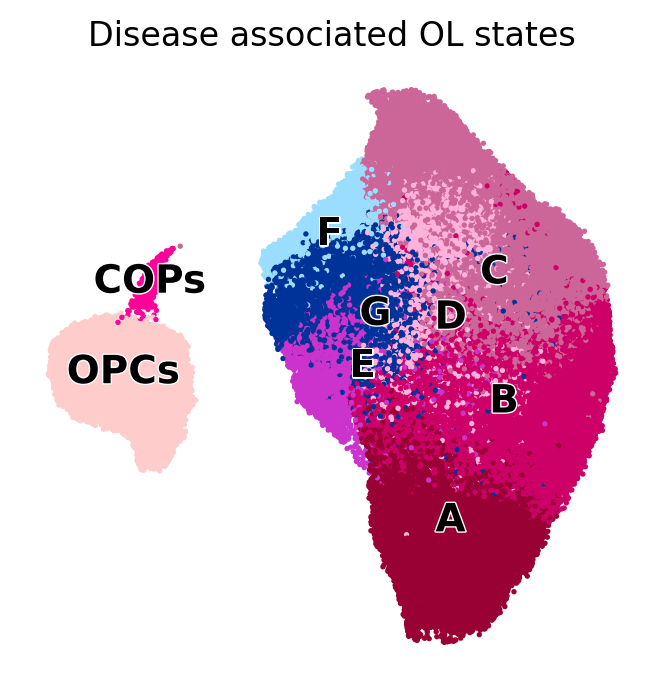

In [19]:
cluster_color = {
    'A': '#990033',
    'B': '#cc0066',
    'C': '#cc6699',
    'F': '#9bddff',
    'G': '#003399',
    'D': '#ffb3db',
    'E': '#cc33cc',
    'OPCs': '#ffcccc',
    'COPs': '#ff0099',
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['OL_fine_type_NEW_abbrev'], legend_fontsize =float(14) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,s=15, legend_loc='on data',
           legend_fontweight= 'bold', title='Disease associated OL states', frameon= False , 
           legend_fontoutline=1, save='_human_scVI_OL_cell_type_NEW_abbrev.png')

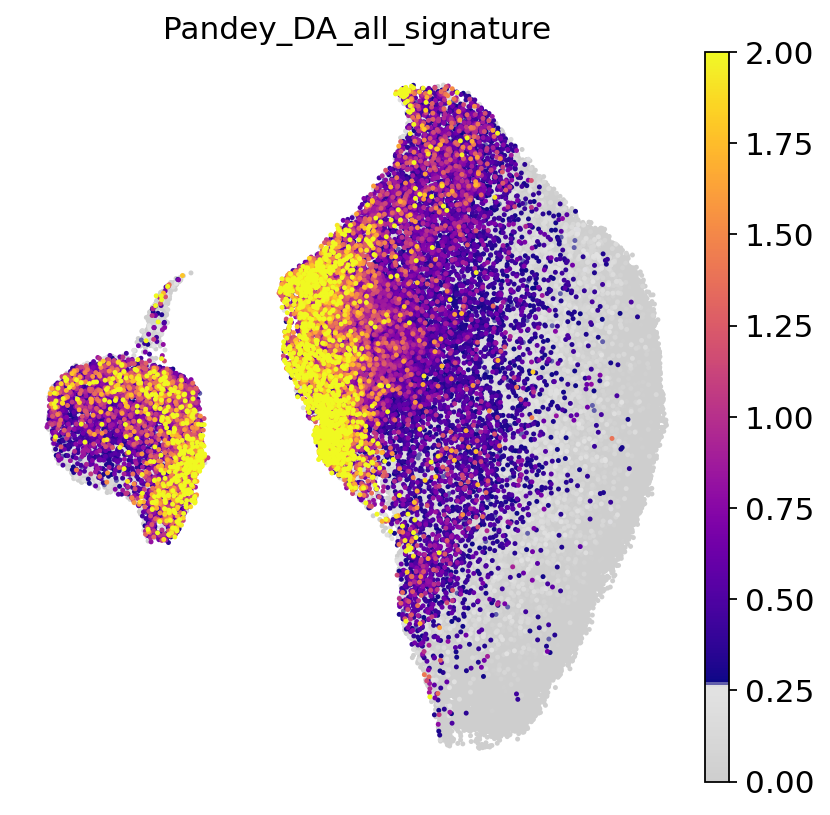

In [64]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['Pandey_DA_all_signature'],legend_fontsize =float(12),
           cmap=mymap2, vmin=0, vmax=2, legend_fontweight= 'normal', frameon= False, s=20,
          save=today+'_Pandey_DA_sig.png')

In [18]:
# Define the desired order of lesion types
lesion_order = ["WM", "NAWM", "AL", "CAL", "CIL", "RL"]

# Convert lesion_type column to categorical with the specified order
adata.obs['lesion_type'] = pd.Categorical(
    adata.obs['lesion_type'], 
    categories=lesion_order, 
    ordered=True
)

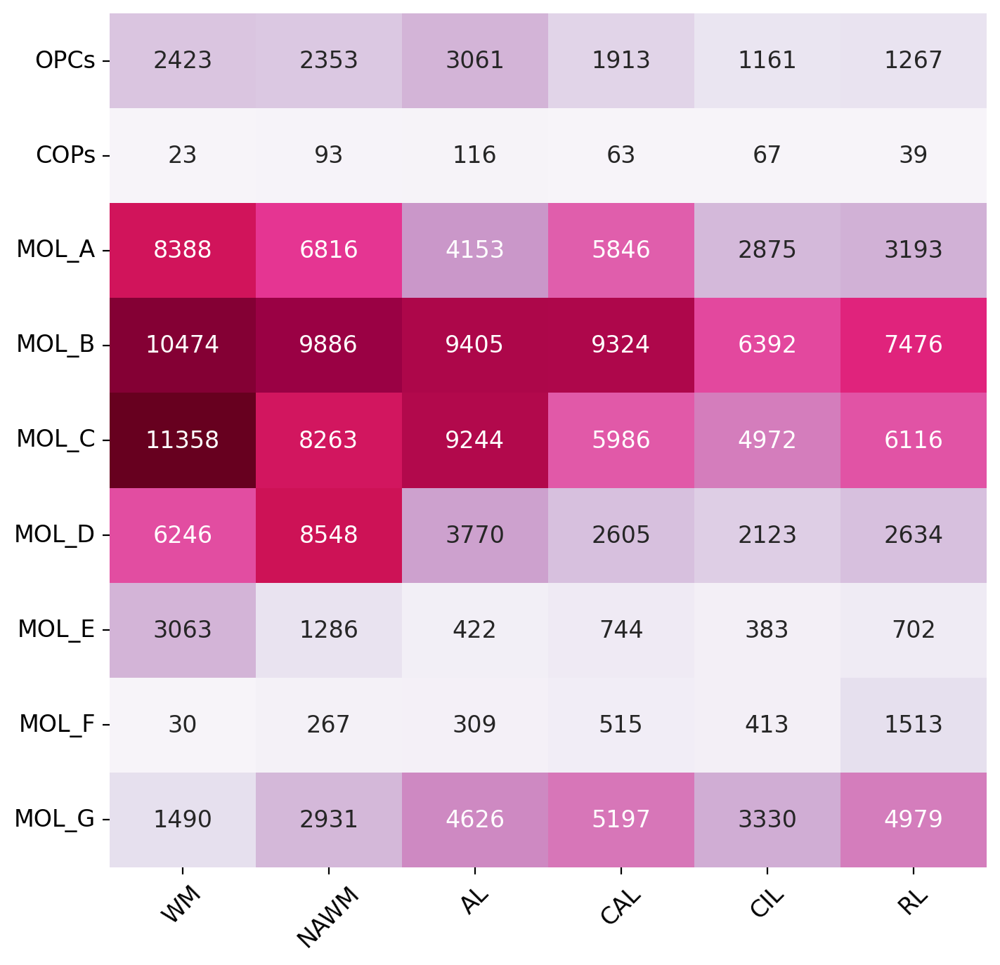

In [19]:
crosstab_df = pd.crosstab(adata.obs.OL_fine_type_NEW, adata.obs.lesion_type)

# Create the heatmap with integer annotations
plt.figure(figsize=(8, 8))  # Adjust the figure size to make it more square
ax = sb.heatmap(crosstab_df, cmap="PuRd", annot=True, fmt="d", cbar=False, square=False)

# Remove grid lines
ax.grid(False)

# Remove axis labels (titles)
ax.set_xlabel(None)
ax.set_ylabel(None)

# Rotate tick labels for better visibility
ax.tick_params(axis='x', rotation=45)
ax.tick_params(axis='y', rotation=0)

# Alternatively, for vector graphics format
plt.savefig('./figures_OL/crosstab_cluster_annotation_vs_lesion_MOL.png', dpi=300, bbox_inches='tight')

# Show the heatmap
plt.show()

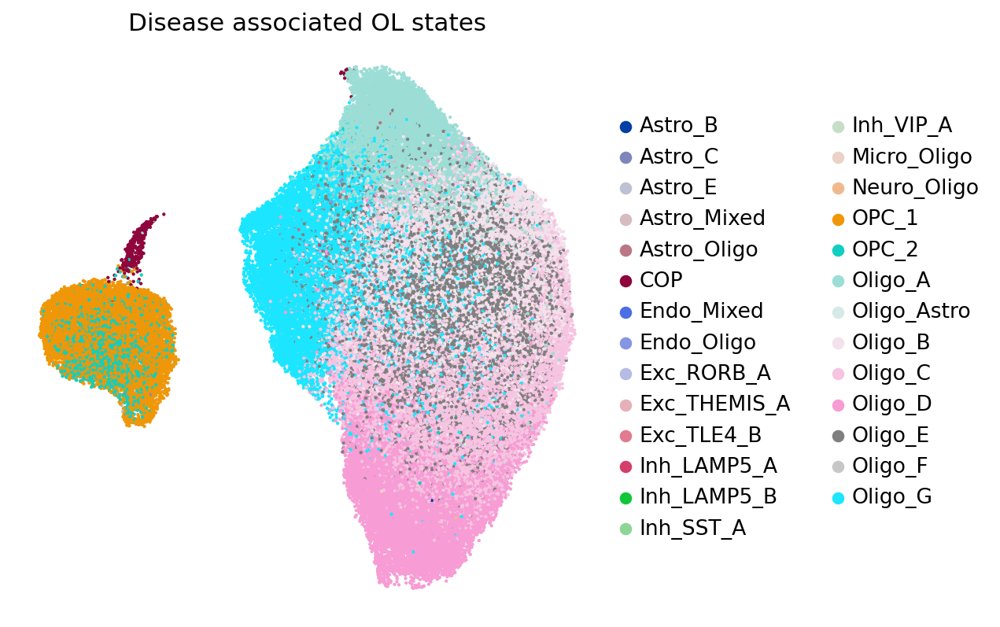

In [37]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['type_fine'], legend_fontsize =float(12) , wspace=0.6, 
           cmap=mymap2,s=15,
           legend_fontweight= 'bold', title='Disease associated OL states', frameon= False , 
           legend_fontoutline=1, save=today+'_Macnair_OL_cell_type.png')

In [119]:
adata.var["mito"] = adata.var_names.str.startswith(("MT-"))

In [120]:
sc.pp.calculate_qc_metrics(
    adata, qc_vars=["mito"], inplace=True, percent_top=[20], log1p=True)

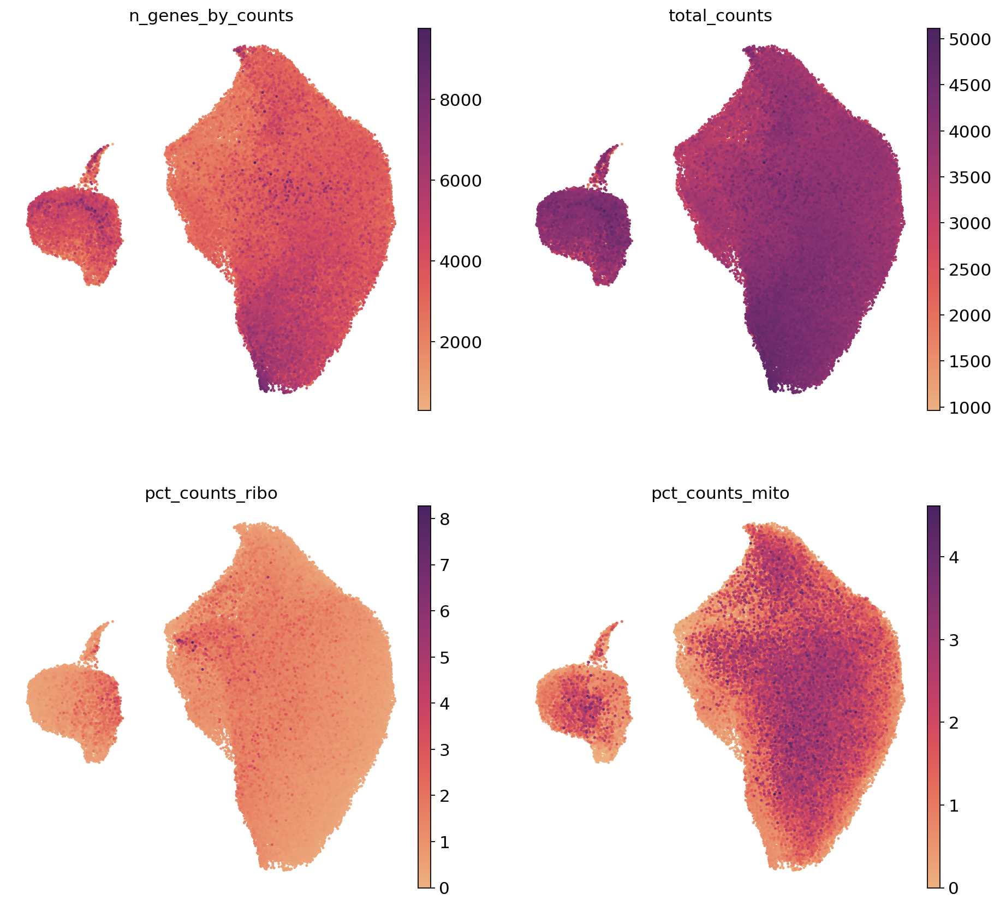

In [121]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

sc.pl.umap(adata, color=['n_genes_by_counts', 'total_counts', 
                         'pct_counts_ribo','pct_counts_mito'],
           cmap='flare',ncols=2, s=20, frameon=False,
          save='_Human_scVI_integration_QC_plots_reduced.png')

In [40]:
sc.tl.paga(adata, groups='OL_fine_type_NEW', use_rna_velocity=False, model='v1.2', neighbors_key=None, copy=False)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:03)


--> added 'pos', the PAGA positions (adata.uns['paga'])


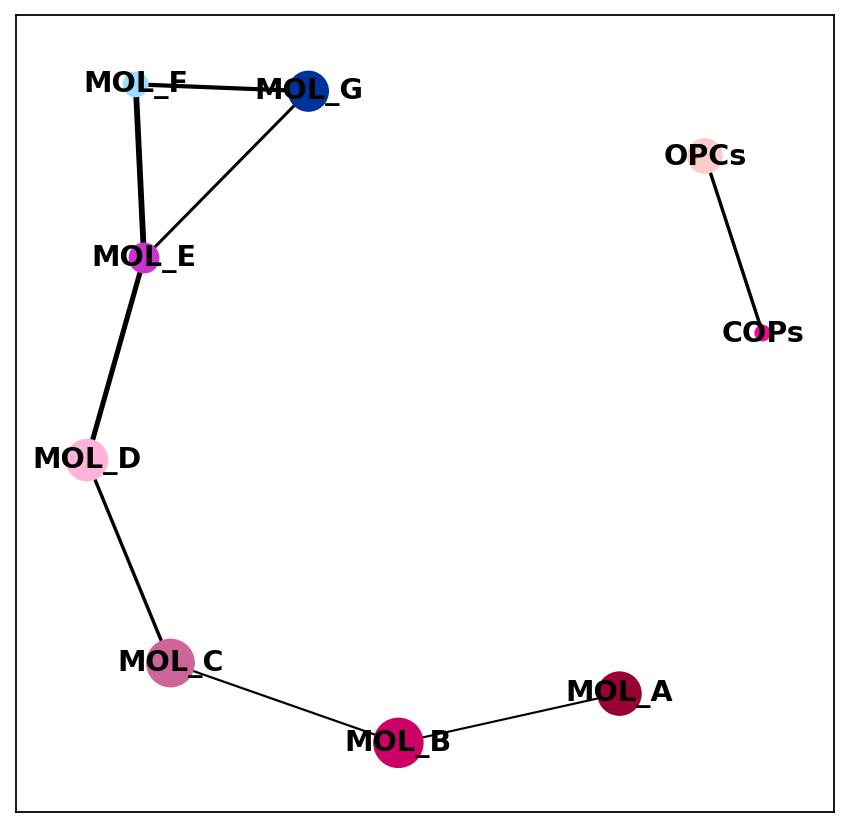

In [41]:
# Save the PAGA plot as a png file
sc.pl.paga(adata, threshold=0.25, node_size_scale=2, edge_width_scale=0.5, save='_paga_plot.png')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_OL_fine_type_NEW_abbrev']`


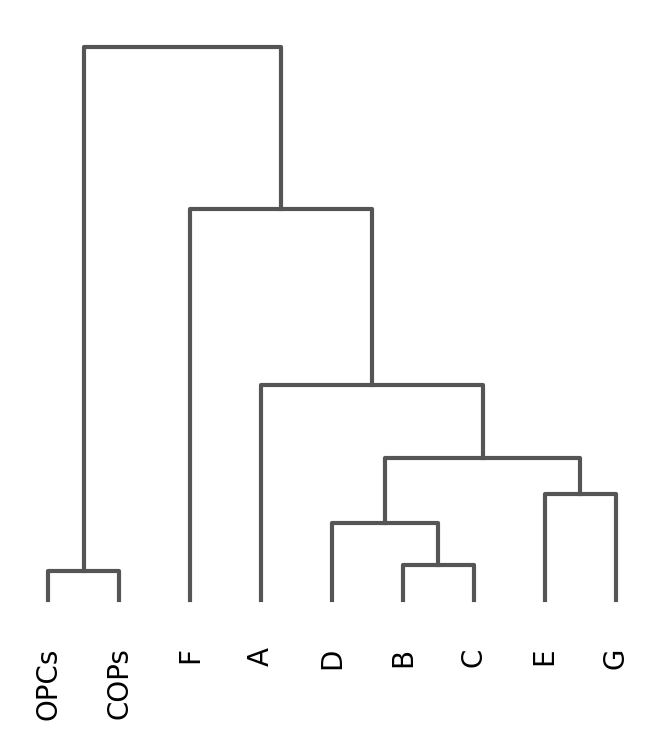

<Axes: >

In [55]:
sc.tl.dendrogram(adata, 'OL_fine_type_NEW_abbrev')
sc.pl.dendrogram(adata, 'OL_fine_type_NEW_abbrev')

In [56]:
sc.tl.paga(adata, groups='OL_fine_type_NEW_abbrev', use_rna_velocity=False, model='v1.2', neighbors_key=None, copy=False)

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:04)


--> added 'pos', the PAGA positions (adata.uns['paga'])


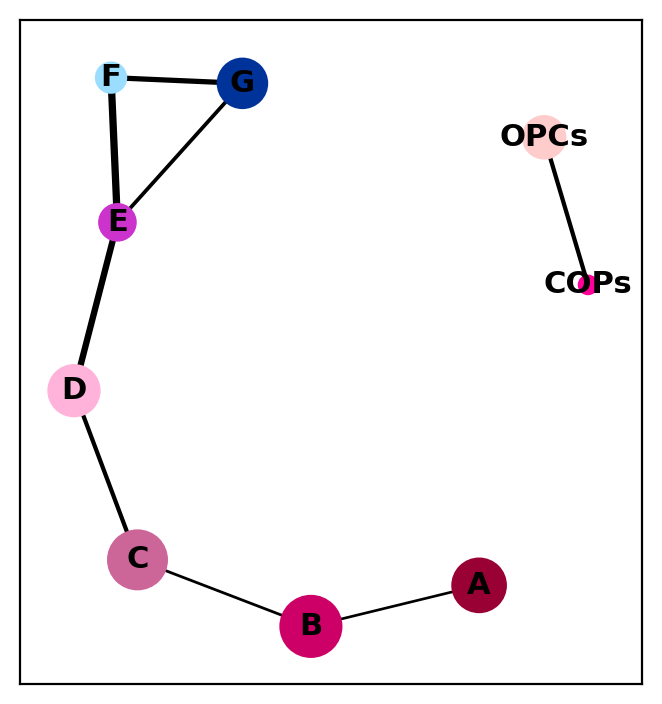

In [57]:
# Save the PAGA plot as a png file
sc.pl.paga(adata, threshold=0.25, node_size_scale=2, edge_width_scale=0.5, save='_paga_plot.png')

/tmp/1018280.1.gpu/ipykernel_2869985/3209171892.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  pos = pos.groupby("group").mean()


--> added 'pos', the PAGA positions (adata.uns['paga'])


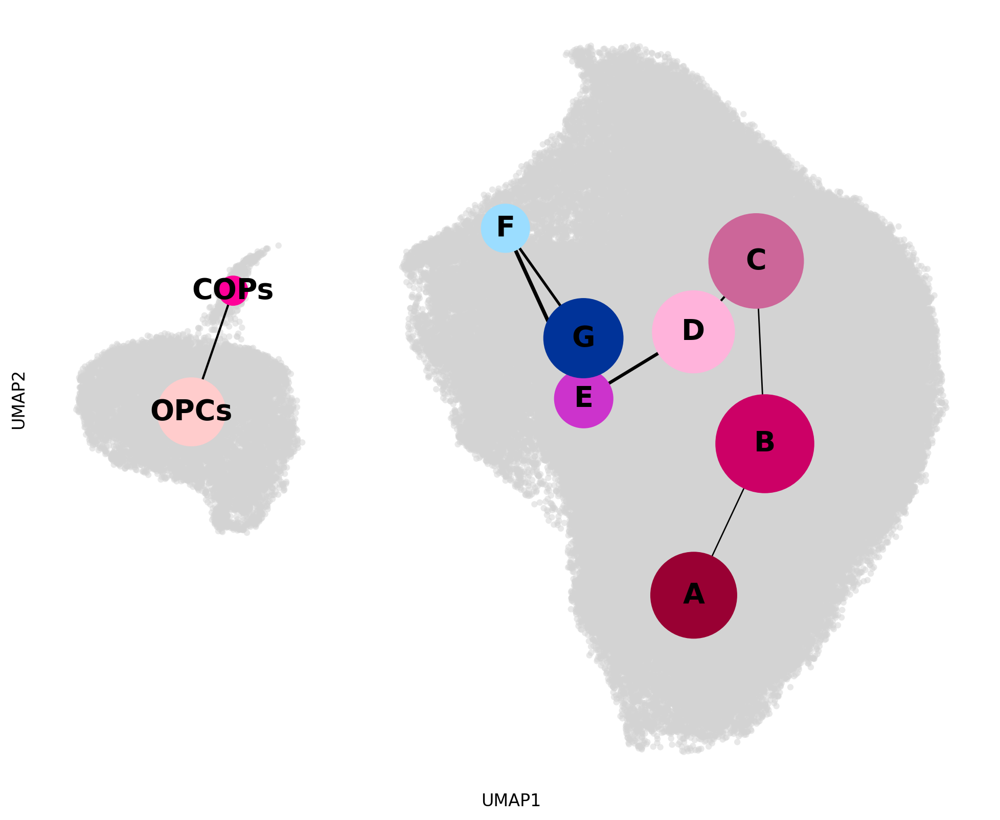

In [58]:
# Define threshold
thr = 0.25

# Define PAGA positions based on the UMAP layout -
# for each cluster we use the mean of the UMAP positions from the cells in that cluster
pos = pd.DataFrame(adata.obsm["X_umap"], index=adata.obs_names)
pos["group"] = adata.obs[adata.uns["paga"]["groups"]]
pos = pos.groupby("group").mean()

# Adjust the figure size
fig, ax = plt.subplots(figsize=(12, 10))  # Increase the figure size

# Plot UMAP in the background on the same ax
sc.pl.umap(adata, ax=ax, show=False, size=80, alpha=0.5)

# Plot PAGA on top of the UMAP on the same ax
sc.pl.paga(
    adata,
    color="OL_fine_type_NEW_abbrev",
    threshold=thr,
    node_size_scale=20,
    edge_width_scale=0.5,
    pos=pos.values,
    random_state=0,
    ax=ax,
    frameon=False,
    fontsize=20,  # Adjust the fontsize for the node labels
    save=today+'PAGA_MOL_DAO_LARGE.png'
)

# Show the plot
plt.show()

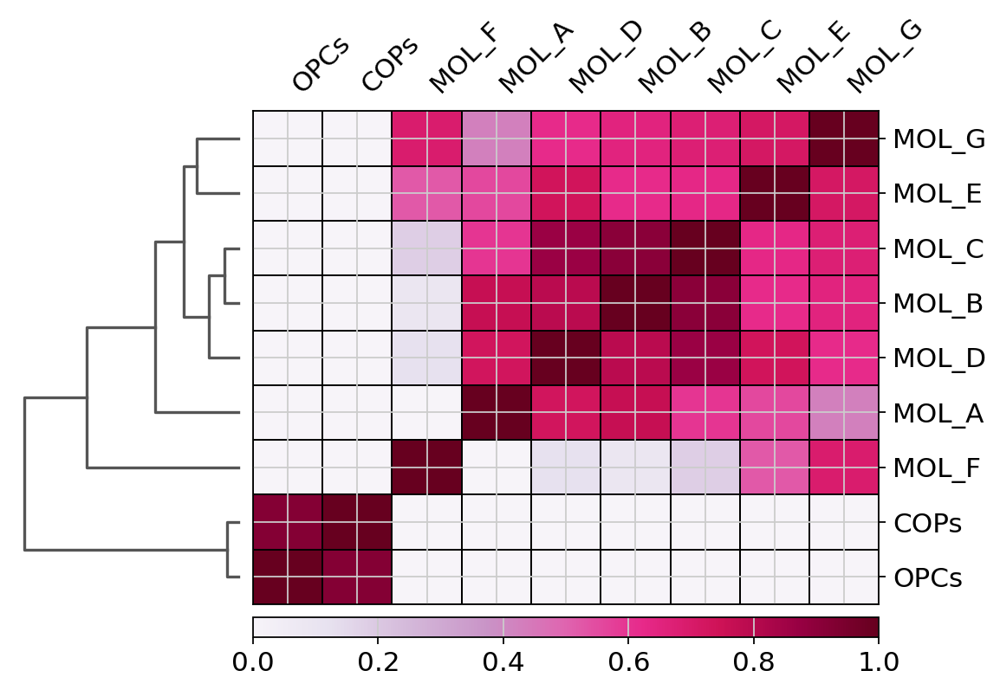

In [43]:
ax = sc.pl.correlation_matrix(adata, "OL_fine_type_NEW", figsize=(8, 5),color='black', vmin=0, cmap='PuRd', save=today+'correlation_matrix.png')

## Play with density plot number?

In [8]:
adata.obs['lesion_type'].value_counts()

lesion_type
WM      43495
NAWM    40443
AL      35106
CAL     32193
RL      27919
CIL     21716
Name: count, dtype: int64

In [13]:
MS_AL = sc.pp.subsample(adata[adata.obs['lesion_type']=='AL'],n_obs=10000,copy=True).obs_names
MS_NAWM = sc.pp.subsample(adata[adata.obs['lesion_type']=='NAWM'],n_obs=10000,copy=True).obs_names
MS_CAL = sc.pp.subsample(adata[adata.obs['lesion_type']=='CAL'],n_obs=10000,copy=True).obs_names
hs_WM = sc.pp.subsample(adata[adata.obs['lesion_type']=='WM'],n_obs=10000,copy=True).obs_names
MS_RL = sc.pp.subsample(adata[adata.obs['lesion_type']=='RL'],n_obs=10000,copy=True).obs_names
MS_CIL = sc.pp.subsample(adata[adata.obs['lesion_type']=='CIL'],n_obs=10000,copy=True).obs_names

adata_sub = adata[list(MS_AL) + list(MS_CAL) + list(MS_NAWM) + list(hs_WM) + list(MS_RL) +
                                list(MS_CIL) ].copy()

sc.tl.embedding_density(adata_sub, basis='umap', groupby='lesion_type')

computing density on 'umap'
--> added
    'umap_density_lesion_type', densities (adata.obs)
    'umap_density_lesion_type_params', parameter (adata.uns)


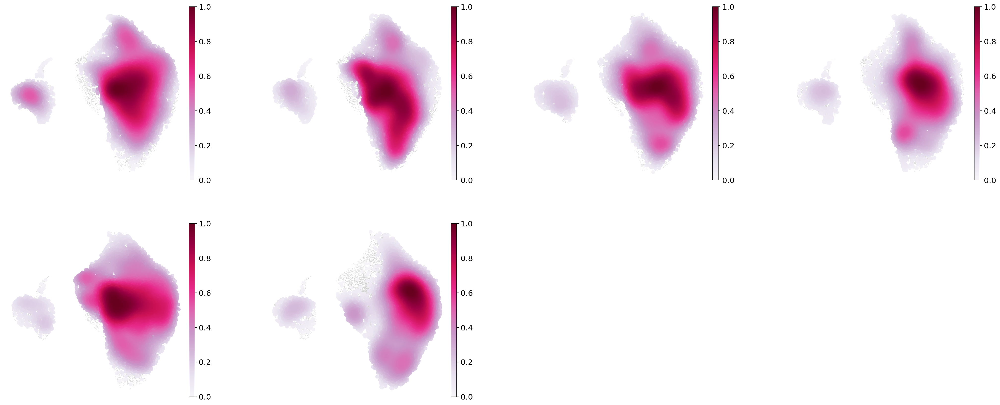

In [14]:
sc.pl.embedding_density(adata_sub, basis='umap',  key='umap_density_lesion_type', title='',
                        color_map='PuRd', wspace=0.3, bg_dotsize = 2, frameon= False, 
                        save='_Human_scVI_lesion_density_n10k.png')

In [11]:
MS_AL = sc.pp.subsample(adata[adata.obs['lesion_type']=='AL'],n_obs=1000,copy=True).obs_names
MS_NAWM = sc.pp.subsample(adata[adata.obs['lesion_type']=='NAWM'],n_obs=1000,copy=True).obs_names
MS_CAL = sc.pp.subsample(adata[adata.obs['lesion_type']=='CAL'],n_obs=1000,copy=True).obs_names
hs_WM = sc.pp.subsample(adata[adata.obs['lesion_type']=='WM'],n_obs=1000,copy=True).obs_names
MS_RL = sc.pp.subsample(adata[adata.obs['lesion_type']=='RL'],n_obs=1000,copy=True).obs_names
MS_CIL = sc.pp.subsample(adata[adata.obs['lesion_type']=='CIL'],n_obs=1000,copy=True).obs_names

adata_sub = adata[list(MS_AL) + list(MS_CAL) + list(MS_NAWM) + list(hs_WM) + list(MS_RL) +
                                list(MS_CIL) ].copy()

sc.tl.embedding_density(adata_sub, basis='umap', groupby='lesion_type')

computing density on 'umap'
--> added
    'umap_density_lesion_type', densities (adata.obs)
    'umap_density_lesion_type_params', parameter (adata.uns)


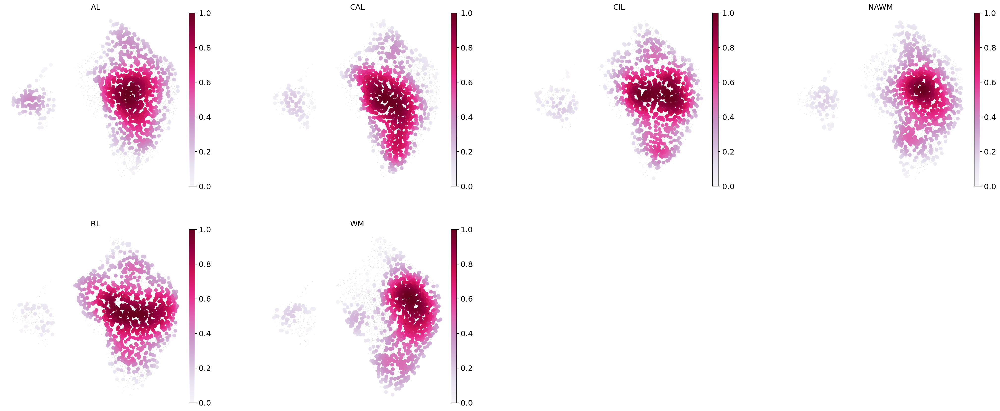

In [12]:
sc.pl.embedding_density(adata_sub, basis='umap',  key='umap_density_lesion_type', 
                        color_map='PuRd', wspace=0.3, bg_dotsize = 2, frameon= False)

# ADD BAR CHARTS

In [56]:
import os
print(os.getcwd())

/afs/crc.nd.edu/user/e/eaboelno/sysVI_analysis/H2M_sysVI_cell_type_refined/Human_scVI_single

In [61]:
# Group by 'treatment_meta' and 'cell_type_eval' to count cells
cell_type_counts = adata.obs.groupby(['lesion_type', 'OL_fine_type_NEW']).size().reset_index(name='cell_count')

# Pivot the DataFrame to have treatments as index and cell types as columns
pivoted_counts = cell_type_counts.pivot(index='OL_fine_type_NEW', columns='lesion_type', values='cell_count').fillna(0)

# Add totals
total_cells = pivoted_counts.sum()

# Add percent
percent_counts = pivoted_counts.div(total_cells) * 100
percent_counts_transposed = percent_counts.transpose()

# Define the desired order of treatments and cell types
desired_treatments_order = ['WM', 'NAWM', 'AL', 'CAL', 'CIL', 'RL']
desired_cell_types_order = ['OPCs', 'COPs', 'MOL_A', 'MOL_B', 'MOL_C', 'MOL_D', 'MOL_E', 'MOL_F', 'MOL_G']

# Reorder the columns and the index of the percent_counts DataFrame
percent_counts_reordered = percent_counts_transposed[desired_cell_types_order].reindex(desired_treatments_order)
percent_counts_reordered

/tmp/1018280.1.gpu/ipykernel_2869985/2742993579.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_type_counts = adata.obs.groupby(['lesion_type', 'OL_fine_type_NEW']).size().reset_index(name='cell_count')


OL_fine_type_NEW,OPCs,COPs,MOL_A,MOL_B,MOL_C,MOL_D,MOL_E,MOL_F,MOL_G
lesion_type,,,,,,,,,
WM,5.570755,0.052880,19.284975,24.080929,26.113346,14.360271,7.042189,0.068973,3.425681
NAWM,5.818065,0.229953,16.853349,24.444280,20.431224,21.135920,3.179784,0.660188,7.247237
AL,8.719307,0.330428,11.829887,26.790292,26.331681,10.738905,1.202074,0.880191,13.177235
CAL,5.942286,0.195695,18.159227,28.962818,18.594104,8.091821,2.311061,1.599727,16.143261
CIL,5.346288,0.308528,13.239086,29.434518,22.895561,9.776202,1.763677,1.901824,15.334316
RL,4.538128,0.139690,11.436656,26.777463,21.906229,9.434435,2.514417,5.419249,17.833733


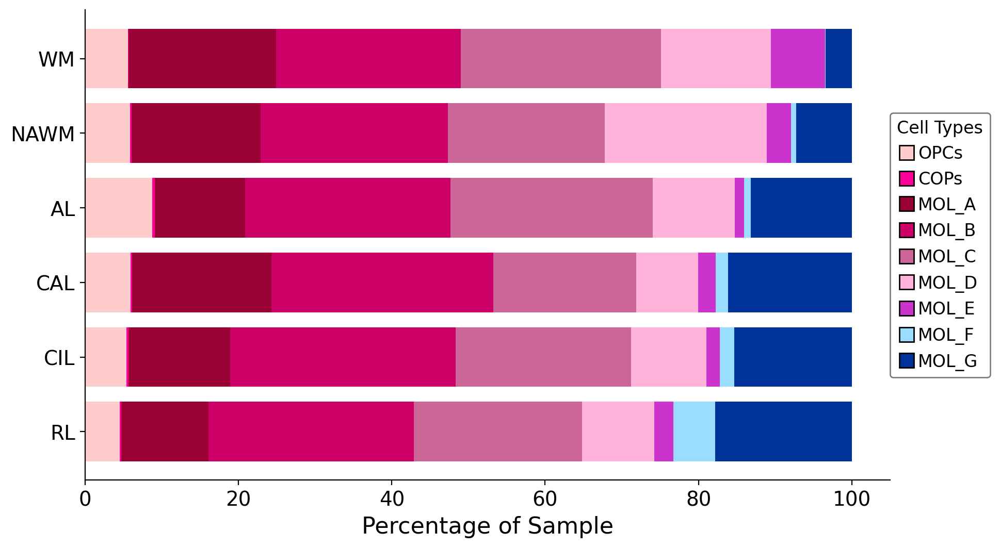

In [75]:
# Define the custom color map for the updated cell types, including 'Other'
custom_colors = {
    'MOL_A': '#990033',
    'MOL_B': '#cc0066',
    'MOL_C': '#cc6699',
    'MOL_F': '#9bddff',
    'MOL_G': '#003399',
    'MOL_D': '#ffb3db',
    'MOL_E': '#cc33cc',
    'OPCs': '#ffcccc',
    'COPs': '#ff0099',
}

# Define the colors for the stacked bar chart in the order of desired_cell_types_order_updated
colors = [custom_colors[cell_type] for cell_type in desired_cell_types_order]

# Plot the horizontal stacked bar chart with custom colors
ax = percent_counts_reordered.plot(kind='barh', stacked=True, figsize=(10, 6), color=colors, width=0.8)

# Set the title and labels with increased font size
ax.set_xlabel('Percentage of Sample', fontsize=16)  # Increase font size

# Remove y-axis label
ax.set_ylabel('')  # Empty string to remove label

# Increase font size of ticks
plt.xticks(fontsize=14)  # Increase font size
plt.yticks(fontsize=14)  # Increase font size

# Invert the y-axis to reverse the order
ax.invert_yaxis()

# Remove grid lines
ax.grid(False)

# Remove border
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

# Create legend with transparency
legend_handles = [plt.Line2D([0], [0], marker='s', color='w', markerfacecolor=custom_colors[col], markersize=10, markeredgecolor='black') for col in percent_counts_reordered.columns]
#legend = ax.legend(legend_handles, percent_counts_reordered.columns, loc='lower center', fontsize=12, title='Cell Types')
legend = ax.legend(legend_handles, percent_counts_reordered.columns, loc='center left', fontsize=12, title='Cell Types', bbox_to_anchor=(1, 0.5), borderaxespad=0.)

# Set transparency of the legend
legend.get_frame().set_alpha(0.5)  # Set alpha value for transparency (0.5 makes it semi-transparent)

# Optionally, add a border color for contrast
legend.get_frame().set_edgecolor('black')  # Set border color of the legend

# Save the plot as a PNG file
plt.savefig('./figures_OL/cell_types_barh.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

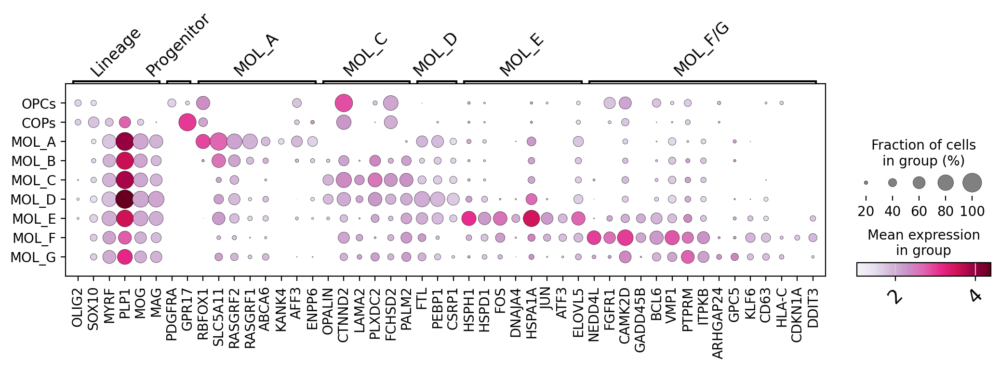

In [69]:
# Known marker genes with mouse gene names
marker_genes_human = {
    'Lineage': ['OLIG2','SOX10', 'MYRF', 'PLP1', 'MOG', 'MAG'],
    'Progenitor': ['PDGFRA', 'GPR17'],
    'MOL_A': ['RBFOX1', 'SLC5A11', 'RASGRF2', 'RASGRF1', 'ABCA6', 'KANK4', 'AFF3', 'ENPP6'],
    'MOL_C': ['OPALIN', 'CTNND2', 'LAMA2', 'PLXDC2', 'FCHSD2', 'PALM2'],
    'MOL_D': ['FTL', 'PEBP1', 'CSRP1'],
    'MOL_E': ['HSPH1', 'HSPD1', 'FOS', 'DNAJA4', 'HSPA1A', 'JUN', 'ATF3', 'ELOVL5'],
    'MOL_F/G': ['NEDD4L', 'FGFR1', 'CAMK2D', 'GADD45B', 'BCL6', 'VMP1',
                'PTPRM', 'ITPKB', 'ARHGAP24', 'GPC5', 'KLF6', 'CD63', 'HLA-C', 'CDKN1A', 'DDIT3']
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes_human.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes_human.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
        adata,
        groupby="OL_fine_type_NEW",
        var_names=all_genes,
        use_raw=False,
        log=False,
        dendrogram=False,
        layer='log1p_norm',
        var_group_positions=var_group_positions,
        var_group_labels=list(marker_genes_human.keys()),
        var_group_rotation=45,
        swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
        cmap='PuRd',  # Choose a color map for dot intensities
        color_map='PuRd',  # Choose a color map for dot colors
        figsize=(10, 8),  # Set the figure size
        show=False,
        dot_min=0.1,  # Adjust the minimum dot size
        mean_only_expressed=True,
        expression_cutoff=1,
    )

# Get the current Axes instance
ax = plt.gca()

# Set the font size and rotation angle for the x-axis (gene labels)
plt.setp(ax.get_xticklabels(), fontsize=14, rotation=45)

# Set the font size for the y-axis (cell type labels)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)

# Set the font size for the x-axis (gene labels)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)

# Adjust spacing between y-axis ticks
plt.subplots_adjust(left=0.00001)  # Adjust left margin to reduce space between dots: smaller gives more space
#plt.subplots_adjust(bottom=0.5) 
plt.subplots_adjust(top=0.4) # adjust space up and down between dots, bigger makes bigger space

# Save the plot as a PNG file
plt.savefig('./figures_OL/Human_dotplot_OL_DAO_markers.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

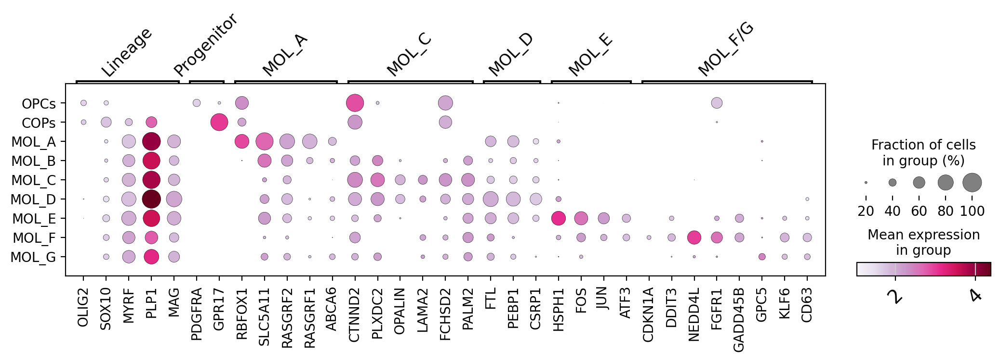

In [74]:
# Known marker genes with mouse gene names
marker_genes_human = {
    'Lineage': ['OLIG2','SOX10', 'MYRF', 'PLP1', 'MAG'],
    'Progenitor': ['PDGFRA', 'GPR17'],
    'MOL_A': ['RBFOX1', 'SLC5A11', 'RASGRF2', 'RASGRF1', 'ABCA6'],
    'MOL_C': ['CTNND2','PLXDC2','OPALIN', 'LAMA2', 'FCHSD2', 'PALM2'],
    'MOL_D': ['FTL', 'PEBP1', 'CSRP1'],
    'MOL_E': ['HSPH1', 'FOS', 'JUN', 'ATF3'],
    'MOL_F/G': ['CDKN1A', 'DDIT3','NEDD4L', 'FGFR1', 'GADD45B', 'GPC5', 'KLF6', 'CD63']
}

# Flatten the list of genes in marker_genes while maintaining order
all_genes = [gene for genes in marker_genes_human.values() for gene in genes]

# Correct var_group_positions based on marker_genes
var_group_positions = []
start = 0
for genes in marker_genes_human.values():
    end = start + len(genes) - 1  # Calculate the end index for the group
    var_group_positions.append((start, end))  # Add the start and end index to var_group_positions
    start = end + 1  # Update the start index for the next group

# Plot the dotplot with the corrected parameters
ax = sc.pl.dotplot(
        adata,
        groupby="OL_fine_type_NEW",
        var_names=all_genes,
        use_raw=False,
        log=False,
        dendrogram=False,
        layer='log1p_norm',
        var_group_positions=var_group_positions,
        var_group_labels=list(marker_genes_human.keys()),
        var_group_rotation=45,
        swap_axes=False,  # Keep genes on the x-axis and cell types on the y-axis
        cmap='PuRd',  # Choose a color map for dot intensities
        color_map='PuRd',  # Choose a color map for dot colors
        figsize=(10, 8),  # Set the figure size
        show=False,
        dot_min=0.15,  # Adjust the minimum dot size
        mean_only_expressed=True,
        expression_cutoff=1,
    )

# Get the current Axes instance
ax = plt.gca()

# Set the font size and rotation angle for the x-axis (gene labels)
plt.setp(ax.get_xticklabels(), fontsize=14, rotation=45)

# Set the font size for the y-axis (cell type labels)
ax.set_ylabel(ax.get_ylabel(), fontsize=16)

# Set the font size for the x-axis (gene labels)
ax.set_xlabel(ax.get_xlabel(), fontsize=16)

# Adjust spacing between y-axis ticks
plt.subplots_adjust(left=0.00001)  # Adjust left margin to reduce space between dots: smaller gives more space
#plt.subplots_adjust(bottom=0.5) 
plt.subplots_adjust(top=0.4) # adjust space up and down between dots, bigger makes bigger space

# Save the plot as a PNG file
plt.savefig('./figures_OL/Human_dotplot_OL_DAO_markers.png', bbox_inches='tight', dpi=300)  # Increase DPI for higher resolution

# Show the plot
plt.show()

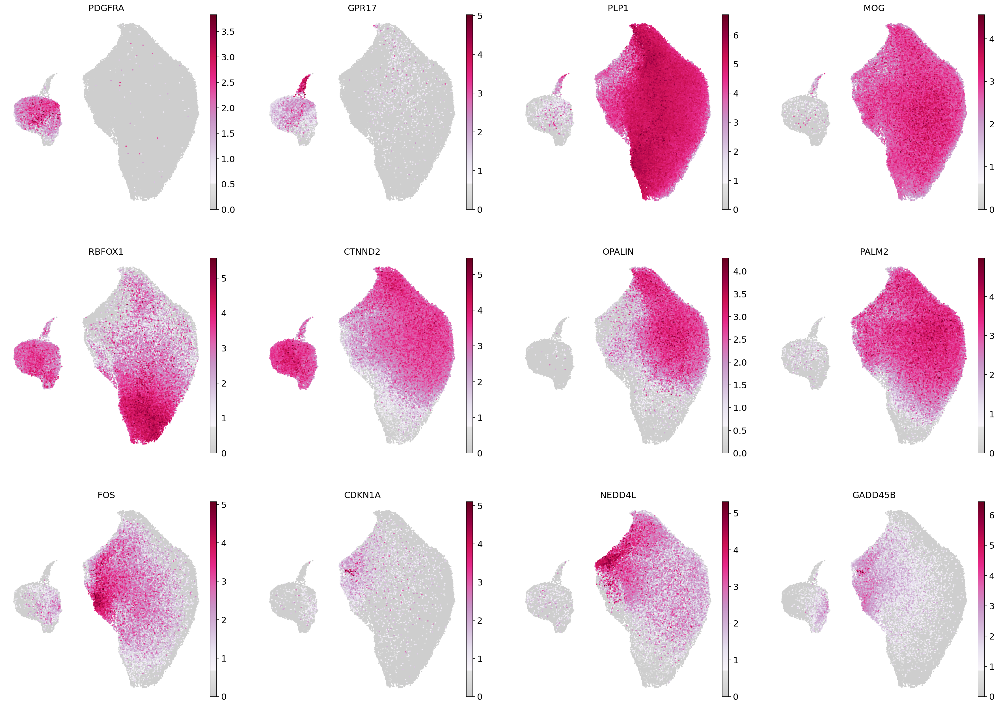

In [67]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

# Define a nice color map for gene expression
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))  # Use PuRd color map for deep red/purple color
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))  # Greys for low values
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

sc.pl.umap(adata, 
           color=['PDGFRA', 'GPR17', 'PLP1', 'MOG',
                 'RBFOX1', 'CTNND2', 'OPALIN', 'PALM2',
                 'FOS', 'CDKN1A','NEDD4L', 'GADD45B'], 
           use_raw=False, 
           color_map=mymap, 
           ncols=4, 
           frameon=False, 
           s=20, 
           legend_fontweight='bold', 
           legend_fontoutline=1, save='_Human_scVI_OL_markersNEW.png')

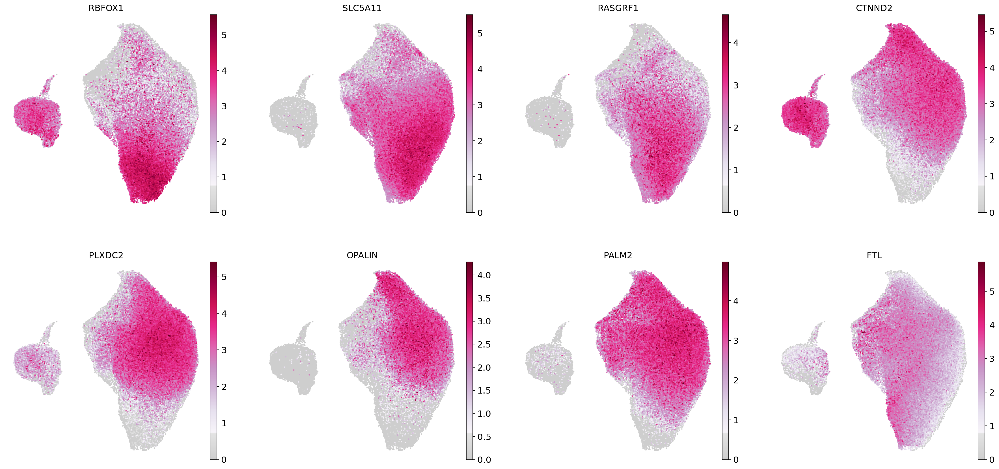

In [89]:
# Set figure parameters for high-resolution display and saving
sc.set_figure_params(dpi_save=300, figsize=(6, 6), transparent=True)

# Define a nice color map for gene expression
colors2 = plt.cm.PuRd(np.linspace(0, 1, 128))  # Use PuRd color map for deep red/purple color
colors3 = plt.cm.Greys_r(np.linspace(0.7, 0.8, 20))  # Greys for low values
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

sc.pl.umap(adata, 
           color=['RBFOX1', 'SLC5A11', 'RASGRF1', 'CTNND2','PLXDC2','OPALIN', 
                  'PALM2', 'FTL'], 
           use_raw=False, 
           color_map=mymap, 
           ncols=4, 
           frameon=False, 
           s=20, 
           legend_fontweight='bold', 
           legend_fontoutline=1, save='_Human_scVI_OL_markers2.png')

# ANNOTATE THE LEIDEN

In [76]:
#cell_type = {str(i): '' for i in range(18)}
cell_type = {
 '0': '0_MOL_A',
 '1': '1_MOL_G',
 '2': '2_MOL_B',
 '3': '3_MOL_C',
 '4': '4_MOL_C',
 '5': '5_OPCs',
 '6': '6_MOL_C',
 '7': '7_MOL_V',
 '8': '8_MOL_A',
 '9': '9_MOL_B',
 '10': '10_MOL_D',
 '11': '11_MOL_D',
 '12': '12_MOL_F',
 '13': '13_MOL_D',
 '14': '14_MOL_B',
 '15': '15_MOL_C',
 '16': '16_MOL_E',
 '17': '17_MOL_B',
 '18': '18_MOL_A',
 '19': '19_MOL_B',
 '20': '20_MOL_F',
 '21': '21_COPs'
}

adata.obs['OL_leiden_annotated'] = adata.obs['scVI_leiden_OL_1.5'].map(cell_type).astype('category')

In [77]:
adata.obs['OL_leiden_annotated'].value_counts()

OL_leiden_annotated
0_MOL_A     15587
1_MOL_G     14676
2_MOL_B     14382
3_MOL_C     13787
4_MOL_C     13147
5_OPCs      12178
6_MOL_C     11694
7_MOL_V     11321
8_MOL_A     11021
9_MOL_B     10599
10_MOL_D     9938
11_MOL_D     8115
12_MOL_F     7877
13_MOL_D     7873
14_MOL_B     7582
15_MOL_C     7311
16_MOL_E     6600
17_MOL_B     5850
18_MOL_A     4663
19_MOL_B     3223
20_MOL_F     3047
21_COPs       401
Name: count, dtype: int64

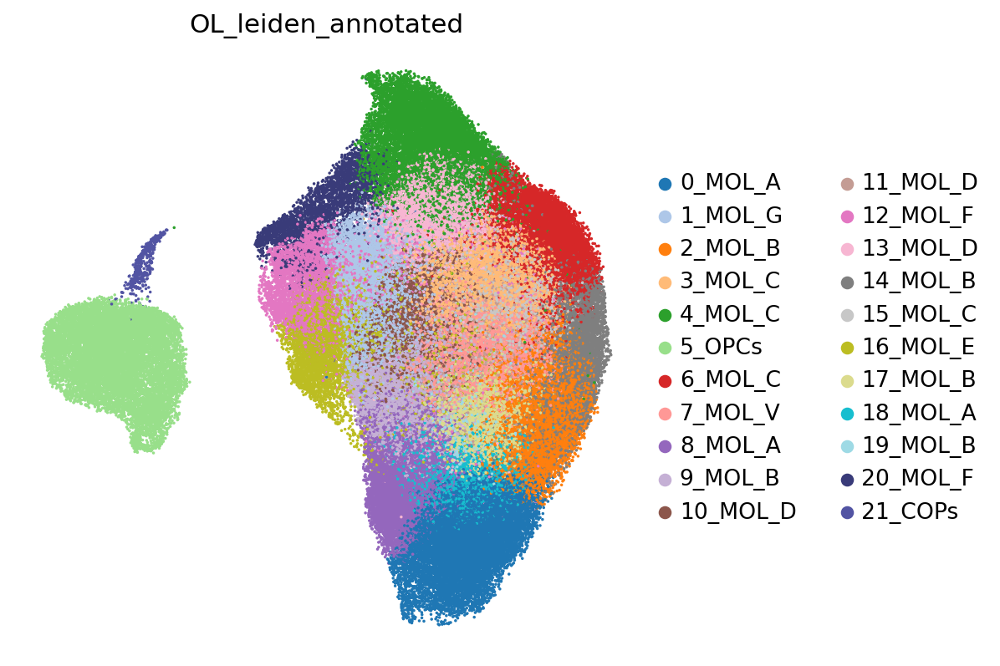

In [62]:
cluster_color = {
    '0_MOL_A': '#1f77b4',
    '1_MOL_G': '#aec7e8',
    '2_MOL_B': '#ff7f0e',
    '3_MOL_C': '#ffbb78',
    '4_MOL_C': '#2ca02c',
    '5_OPCs': '#98df8a',
    '6_MOL_C': '#d62728',
    '7_MOL_V': '#ff9896',
    '8_MOL_A': '#9467bd',
    '9_MOL_B': '#c5b0d5',
    '10_MOL_D': '#8c564b',
    '11_MOL_D': '#c49c94',
    '12_MOL_F': '#e377c2',
    '13_MOL_D': '#f7b6d2',
    '14_MOL_B': '#7f7f7f',
    '15_MOL_C': '#c7c7c7',
    '16_MOL_E': '#bcbd22',
    '17_MOL_B': '#dbdb8d',
    '18_MOL_A': '#17becf',
    '19_MOL_B': '#9edae5',
    '20_MOL_F': '#393b79',
    '21_COPs': '#5254a3'
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['OL_leiden_annotated'], legend_fontsize =float(12) , wspace=0.6, s=10, cmap=mymap2,palette=cluster_color,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, save=today+'_annotated_leiden.png' )

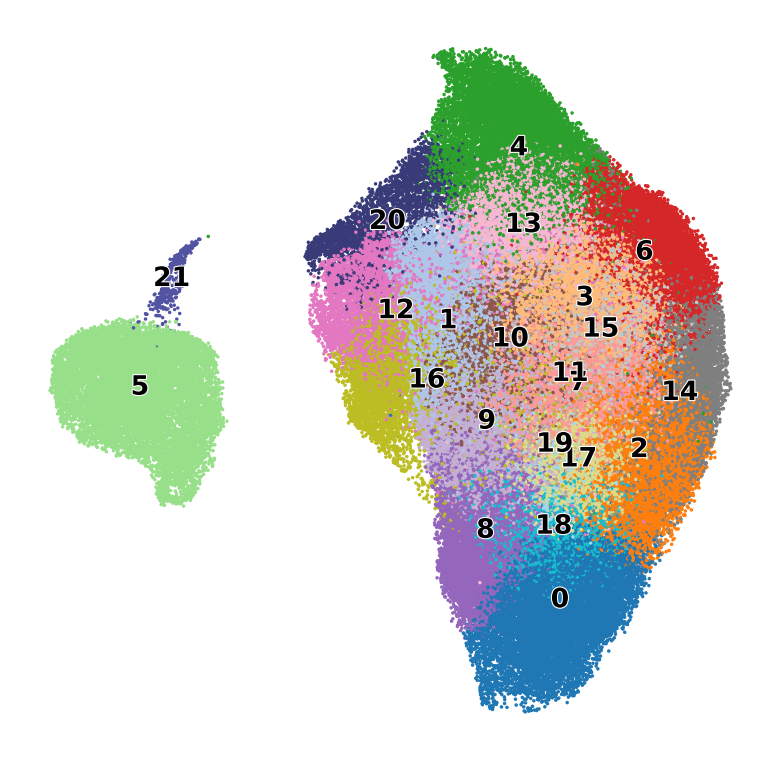

In [61]:
cluster_color = {
    '0': "#1f77b4",   # Blue
    '1': "#aec7e8",   # Light Blue
    '2': "#ff7f0e",   # Orange
    '3': "#ffbb78",   # Light Orange
    '4': "#2ca02c",   # Green
    '5': "#98df8a",   # Light Green
    '6': "#d62728",   # Red
    '7': "#ff9896",   # Light Red
    '8': "#9467bd",   # Purple
    '9': "#c5b0d5",   # Light Purple
    '10': "#8c564b",  # Brown
    '11': "#c49c94",  # Light Brown
    '12': "#e377c2",  # Pink
    '13': "#f7b6d2",  # Light Pink
    '14': "#7f7f7f",  # Gray
    '15': "#c7c7c7",  # Light Gray
    '16': "#bcbd22",  # Olive
    '17': "#dbdb8d",  # Light Olive
    '18': "#17becf",  # Teal
    '19': "#9edae5",  # Light Teal
    '20': "#393b79",  # Dark Blue
    '21': "#5254a3",  # Indigo
}

#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata, color=['scVI_leiden_OL_1.5'], legend_fontsize =float(12) , wspace=0.6, 
           cmap=mymap2,palette=cluster_color,legend_loc='on data', s=10,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, 
           title='', save=today+'_leiden_map_MMsysVI_OL.png')

In [82]:
adata.write_h5ad('/scratch365/eaboelno/BACKUP_h5ad_IMPORTANT/scVI_mdata_OL_NEW.h5ad')
adata

AnnData object with n_obs × n_vars = 200872 × 27766
    obs: 'sample_id', 'publication', 'sample_id_anon', 'individual_id_anon', 'replicate', 'treatment', 'condition', 'tissue', 'time', 'batch', 'lesion_type', 'sample_source', 'diagnosis', 'n_genes_by_counts', 'total_counts', 'pct_counts_mt', 's_score', 'g2m_score', 'phase', 'cell_cycle_diff', 'type_fine', 'type_broad', 'cluster_zoom', 'exclude_pseudobulk', 'seq_pool', 'sex', 'age_at_death', 'smoker', 'cause_of_death', 'years_w_ms', 'pmi_minutes', 'age_scale', 'age_cat', 'pmi_cat', 'pmi_cat2', 'pct_counts_ribo', 'cell_type_eval', 'library_type', 'sample_type', 'organism', 'system', 'n_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'S_score', 'G2M_score', 'Cycling cells', 'Cycling_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DC